<a href="https://colab.research.google.com/github/Pratik1489287/Pratik1489287/blob/main/Global_Financial_Markets_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 📊 Global Financial Markets Analysis (2000–2026)
> **Dataset:** `global_financial_markets_2000_Now.csv`  
> **Assets:** 34 instruments — Stock Indices, Currencies, Commodities, Cryptocurrencies  
> **Records:** ~186,000 rows | **Period:** Jan 2000 – Apr 2026

---
## 📌 Table of Contents
1. [Setup & Library Installation](#setup)
2. [Data Loading & First Look](#loading)
3. [Data Cleaning & Preprocessing](#cleaning)
4. [Exploratory Data Analysis (EDA)](#eda)
5. [Crisis Event Analysis](#crisis)
6. [Cross-Asset Correlation](#correlation)
7. [Volatility Analysis](#volatility)
8. [Statistical Analysis (Sharpe, VaR, Beta)](#stats)
9. [Machine Learning — Price Prediction](#ml)
10. [Export Files for Power BI & PPT](#export)
---

## 🔧 STEP 1 — Setup & Library Installation <a id='setup'></a>

In [ ]:
# ─── Install all required libraries ───────────────────────────────────────────
!pip install pandas numpy matplotlib seaborn plotly scipy scikit-learn statsmodels openpyxl -q
print("✅ All libraries installed!")

✅ All libraries installed!


In [ ]:
# ─── Import all libraries ──────────────────────────────────────────────────────
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

from scipy import stats
from scipy.stats import norm
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

# ─── Plot Style ───────────────────────────────────────────────────────────────
plt.rcParams['figure.figsize'] = (14, 6)
plt.rcParams['axes.spines.top']   = False
plt.rcParams['axes.spines.right'] = False
plt.rcParams['font.family']       = 'DejaVu Sans'
COLORS = ['#2196F3','#4CAF50','#FF9800','#E91E63','#9C27B0',
          '#00BCD4','#F44336','#8BC34A','#FF5722','#795548']

print("✅ All imports successful!")

✅ All imports successful!


## 📂 STEP 2 — Data Loading & First Look <a id='loading'></a>

In [ ]:
# ─── Load Dataset ─────────────────────────────────────────────────────────────
# If running in Google Colab, upload the file first:
#   from google.colab import files
#   files.upload()   ← then select your CSV

df = pd.read_csv('global_financial_markets_2000_Now.csv', parse_dates=['date'])

print("═" * 55)
print(f"  📊 DATASET OVERVIEW")
print("═" * 55)
print(f"  Total Rows       : {len(df):,}")
print(f"  Total Columns    : {df.shape[1]}")
print(f"  Date Range       : {df['date'].min().date()} → {df['date'].max().date()}")
print(f"  Unique Symbols   : {df['symbol'].nunique()}")
# Filter out NaN values before joining to prevent TypeError
print(f"  Asset Types      : {', '.join(df['asset_type'].dropna().unique())}")
print("═" * 55)
df.head(10)

═══════════════════════════════════════════════════════
  📊 DATASET OVERVIEW
═══════════════════════════════════════════════════════
  Total Rows       : 186,348
  Total Columns    : 10
  Date Range       : 2000-01-03 → 2026-04-11
  Unique Symbols   : 34
  Asset Types      : Stock Index, Currency, Commodity, Cryptocurrency
═══════════════════════════════════════════════════════


,date,open,high,low,close,volume,symbol,asset_name,asset_type,region
0,2000-01-03,1469.2500,1478.0000,1438.3600,1455.2200,931800000,^GSPC,S&P500,Stock Index,Global
1,2000-01-03,6961.7202,7159.3301,6720.8701,6750.7598,43072500,^GDAXI,DAX,Stock Index,Global
2,2000-01-03,5209.5400,5384.6602,5209.5400,5375.1099,0,^BSESN,SENSEX,Stock Index,Global
3,2000-01-03,0.0098,0.0099,0.0097,0.0098,0,JPYUSD=X,JPY/USD,Currency,Global
4,2000-01-03,17057.6992,17426.1602,17057.6992,17369.6309,0,^HSI,HSI,Stock Index,Global
5,2000-01-03,4186.1899,4192.1899,3989.7100,4131.1499,1510070000,^IXIC,NASDAQ,Stock Index,Global
6,2000-01-04,18937.4492,19187.6094,18937.4492,19002.8594,0,^N225,Nikkei225,Stock Index,Global
7,2000-01-04,1028.3300,1066.1801,1016.5900,1059.0400,195900,^KS11,KOSPI,Stock Index,Global
8,2000-01-04,1368.6930,1407.5179,1361.2140,1406.3710,0,000001.SS,Shanghai,Stock Index,Global
9,2000-01-04,0.0098,0.0099,0.0097,0.0097,0,JPYUSD=X,JPY/USD,Currency,Global


In [ ]:
# ─── All Assets Summary ───────────────────────────────────────────────────────
asset_summary = df.groupby(['asset_type','symbol','asset_name']).agg(
    Records = ('close','count'),
    Start   = ('date','min'),
    End     = ('date','max'),
    Min_Price = ('close','min'),
    Max_Price = ('close','max')
).reset_index()
asset_summary['Start'] = asset_summary['Start'].dt.date
asset_summary['End']   = asset_summary['End'].dt.date
print("\n📋 All 34 Assets in Dataset:")
pd.set_option('display.max_rows', 40)
asset_summary


📋 All 34 Assets in Dataset:


,asset_type,symbol,asset_name,Records,Start,End,Min_Price,Max_Price
0,Commodity,BZ=F,Brent Crude,4653,2007-07-30,2026-04-10,19.3300,146.0800
1,Commodity,CL=F,Crude Oil (WTI),6435,2000-08-23,2026-04-10,-37.6300,145.2900
2,Commodity,GC=F,Gold,6426,2000-08-30,2026-04-10,255.1000,5318.3999
3,Commodity,HG=F,Copper,6431,2000-08-30,2026-04-10,0.6040,6.1755
4,Commodity,NG=F,Natural Gas,6432,2000-08-30,2026-04-10,1.4820,15.3780
5,Commodity,SI=F,Silver,6428,2000-08-30,2026-04-10,4.0260,115.0800
6,Commodity,ZC=F,Corn,6438,2000-07-17,2026-04-10,174.7500,831.2500
7,Commodity,ZW=F,Wheat,6450,2000-07-17,2026-04-10,233.5000,1425.2500
8,Cryptocurrency,ADA-USD,Cardano,3076,2017-11-09,2026-04-11,0.0240,2.9682
9,Cryptocurrency,BNB-USD,BNB,3076,2017-11-09,2026-04-11,1.5104,1310.2144


In [ ]:
# ─── Asset Type Distribution ──────────────────────────────────────────────────
type_counts = df.groupby('asset_type')['symbol'].nunique().reset_index()
type_counts.columns = ['Asset Type', 'Count']

fig = px.pie(type_counts, names='Asset Type', values='Count',
             title='Asset Type Distribution (34 total)',
             color_discrete_sequence=['#2196F3','#4CAF50','#FF9800','#E91E63'],
             hole=0.4)
fig.update_traces(textinfo='label+percent+value', textfont_size=14)
fig.show()

## 🧹 STEP 3 — Data Cleaning & Preprocessing <a id='cleaning'></a>

In [ ]:
# ─── Missing Value Check ─────────────────────────────────────────────────────
print("🔍 Missing Values per Column:")
missing = df.isnull().sum()
missing_pct = (missing / len(df) * 100).round(2)
missing_df = pd.DataFrame({'Missing Count': missing, 'Missing %': missing_pct})
print(missing_df[missing_df['Missing Count'] > 0] if missing.any() else "✅ No missing values found!")
print()

# ─── Data Types ───────────────────────────────────────────────────────────────
print("📊 Column Data Types:")
print(df.dtypes)
print()

# ─── Duplicate Check ─────────────────────────────────────────────────────────
dups = df.duplicated(subset=['date','symbol']).sum()
print(f"🔄 Duplicate (date, symbol) pairs: {dups}")

🔍 Missing Values per Column:
✅ No missing values found!

📊 Column Data Types:
date          datetime64[ns]
open                 float64
high                 float64
low                  float64
close                float64
volume                 int64
symbol                object
asset_name            object
asset_type            object
region                object
dtype: object

🔄 Duplicate (date, symbol) pairs: 0


In [ ]:
# ─── Feature Engineering ──────────────────────────────────────────────────────
df = df.sort_values(['symbol','date']).reset_index(drop=True)

# Date features
df['year']    = df['date'].dt.year
df['month']   = df['date'].dt.month
df['quarter'] = df['date'].dt.quarter
df['weekday'] = df['date'].dt.day_name()

# Price features (per symbol group)
grp = df.groupby('symbol')
df['daily_return']  = grp['close'].pct_change()
df['log_return']    = np.log(df['close'] / grp['close'].shift(1))
df['return_pct']    = df['daily_return'] * 100
df['price_range']   = df['high'] - df['low']
df['price_range_pct'] = (df['price_range'] / df['open']) * 100

# Moving Averages
df['ma7']   = grp['close'].transform(lambda x: x.rolling(7, min_periods=1).mean())
df['ma30']  = grp['close'].transform(lambda x: x.rolling(30, min_periods=1).mean())
df['ma200'] = grp['close'].transform(lambda x: x.rolling(200, min_periods=1).mean())

# Volatility (30-day rolling std of daily returns, annualized)
df['volatility_30d'] = grp['daily_return'].transform(
    lambda x: x.rolling(30, min_periods=5).std() * np.sqrt(252) * 100)

# Bollinger Bands (for price charts)
df['bb_mid']   = df['ma30']
rolling_std    = grp['close'].transform(lambda x: x.rolling(30, min_periods=1).std())
df['bb_upper'] = df['bb_mid'] + (2 * rolling_std)
df['bb_lower'] = df['bb_mid'] - (2 * rolling_std)

# RSI (14-day)
def compute_rsi(series, window=14):
    delta = series.diff()
    gain  = delta.clip(lower=0).rolling(window).mean()
    loss  = (-delta.clip(upper=0)).rolling(window).mean()
    rs    = gain / loss.replace(0, np.nan)
    return 100 - (100 / (1 + rs))

df['rsi14'] = grp['close'].transform(compute_rsi)

print("✅ Feature Engineering Done!")
print(f"   New columns added: {['year','month','quarter','weekday','daily_return','log_return', 'return_pct','price_range','price_range_pct','ma7','ma30','ma200','volatility_30d','bb_mid','bb_upper','bb_lower','rsi14']}")
print(f"   Final shape: {df.shape}")
df.head(3)

✅ Feature Engineering Done!
   New columns added: ['year', 'month', 'quarter', 'weekday', 'daily_return', 'log_return', 'return_pct', 'price_range', 'price_range_pct', 'ma7', 'ma30', 'ma200', 'volatility_30d', 'bb_mid', 'bb_upper', 'bb_lower', 'rsi14']
   Final shape: (186348, 27)


,date,open,high,low,close,volume,symbol,asset_name,asset_type,region,...,price_range,price_range_pct,ma7,ma30,ma200,volatility_30d,bb_mid,bb_upper,bb_lower,rsi14
0,2000-01-04,1368.693,1407.5179,1361.2140,1406.371,0,000001.SS,Shanghai,Stock Index,Global,...,46.3039,3.383074,1406.3710,1406.3710,1406.3710,NaN,1406.3710,NaN,NaN,NaN
1,2000-01-05,1407.829,1433.7800,1398.3230,1409.682,0,000001.SS,Shanghai,Stock Index,Global,...,35.4570,2.518559,1408.0265,1408.0265,1408.0265,NaN,1408.0265,1412.708961,1403.344039,NaN
2,2000-01-06,1406.036,1463.9550,1400.2531,1463.942,0,000001.SS,Shanghai,Stock Index,Global,...,63.7019,4.530602,1426.6650,1426.6650,1426.6650,NaN,1426.6650,1491.315498,1362.014502,NaN


In [ ]:
# ─── Statistical Summary ─────────────────────────────────────────────────────
print("📊 Descriptive Statistics for Key Columns:")
df[['open','high','low','close','volume','daily_return','volatility_30d']].describe().round(4)

📊 Descriptive Statistics for Key Columns:


,open,high,low,close,volume,daily_return,volatility_30d
count,186348.0000,186348.0000,186348.0000,186348.0000,1.863480e+05,186314.0000,186178.0000
mean,4369.9252,4406.2750,4329.0299,4369.0386,1.237688e+09,0.0006,27.6404
std,10531.6542,10634.2162,10417.4213,10529.7747,5.477377e+09,0.0276,33.7400
min,-14.0000,0.0012,-40.3200,-37.6300,0.000000e+00,-3.0597,0.0000
25%,1.1490,1.1582,1.1403,1.1492,0.000000e+00,-0.0064,10.6661
50%,126.6295,131.1154,123.4568,126.6350,7.078950e+04,0.0000,18.1578
75%,3330.8343,3361.3027,3298.6023,3330.5506,2.145000e+08,0.0071,33.0548
max,124752.1406,126198.0703,123196.0469,124752.5312,3.509679e+11,3.5467,1069.2251


## 📈 STEP 4 — Exploratory Data Analysis (EDA) <a id='eda'></a>

In [ ]:
# ─── 4.1  All Stock Indices — Normalized Price Chart ─────────────────────────
indices = ['^GSPC','^IXIC','^GDAXI','^BSESN','^NSEI','^FTSE','^N225','^HSI','000001.SS','^KS11']
idx_df  = df[df['symbol'].isin(indices)].copy()

# Normalize to 100 at start date
first_vals = idx_df.groupby('symbol')['close'].transform('first')
idx_df['normalized'] = (idx_df['close'] / first_vals) * 100

fig = px.line(idx_df, x='date', y='normalized', color='asset_name',
              title='📈 Global Stock Indices — Normalized to 100 (2000–2026)',
              labels={'normalized':'Index Value (Base=100)','date':''},
              template='plotly_white')
fig.update_layout(legend_title='Index', hovermode='x unified')
fig.show()

In [ ]:
# ─── 4.2  S&P 500 Deep Dive — Price + Volume + MA ────────────────────────────
sp = df[df['symbol'] == '^GSPC'].copy()

fig = make_subplots(rows=3, cols=1, shared_xaxes=True,
                    row_heights=[0.6, 0.2, 0.2],
                    subplot_titles=['S&P 500 Close Price + Moving Averages',
                                    'Daily Volume (Billions)',
                                    'RSI (14-day)'])

# Price + MAs
fig.add_trace(go.Scatter(x=sp['date'], y=sp['close'],   name='Close',   line=dict(color='#2196F3', width=1.5)), row=1, col=1)
fig.add_trace(go.Scatter(x=sp['date'], y=sp['ma30'],    name='MA 30',   line=dict(color='#FF9800', width=1, dash='dot')), row=1, col=1)
fig.add_trace(go.Scatter(x=sp['date'], y=sp['ma200'],   name='MA 200',  line=dict(color='#E91E63', width=1.5, dash='dash')), row=1, col=1)
# Bollinger Bands
fig.add_trace(go.Scatter(x=sp['date'], y=sp['bb_upper'], name='BB Upper', line=dict(color='gray', width=0.5, dash='dot'), showlegend=False), row=1, col=1)
fig.add_trace(go.Scatter(x=sp['date'], y=sp['bb_lower'], name='BB Lower', line=dict(color='gray', width=0.5, dash='dot'),
                         fill='tonexty', fillcolor='rgba(128,128,128,0.08)', showlegend=False), row=1, col=1)
# Volume
fig.add_trace(go.Bar(x=sp['date'], y=sp['volume']/1e9, name='Volume (B)', marker_color='#4CAF50', opacity=0.6), row=2, col=1)
# RSI
fig.add_trace(go.Scatter(x=sp['date'], y=sp['rsi14'], name='RSI 14', line=dict(color='#9C27B0', width=1.2)), row=3, col=1)
fig.add_hline(y=70, line_dash='dash', line_color='red',   row=3, col=1)
fig.add_hline(y=30, line_dash='dash', line_color='green', row=3, col=1)

fig.update_layout(height=700, title_text='S&P 500 — Complete Technical Analysis (2000–2026)',
                  template='plotly_white', hovermode='x unified')
fig.show()

In [ ]:
# ─── 4.3  Commodities — Gold, Oil, Silver, Copper ────────────────────────────
commodities = ['GC=F','CL=F','SI=F','HG=F','NG=F','ZW=F','ZC=F','BZ=F']
comm_df = df[df['symbol'].isin(commodities)].copy()

first_vals = comm_df.groupby('symbol')['close'].transform('first')
comm_df['normalized'] = (comm_df['close'] / first_vals) * 100

fig = px.line(comm_df, x='date', y='normalized', color='asset_name',
              title='🏭 Commodity Prices — Normalized (2000–2026)',
              labels={'normalized':'Value (Base=100)'},
              template='plotly_white')
fig.update_layout(hovermode='x unified')
fig.show()

In [ ]:
# ─── 4.4  Cryptocurrency — Bitcoin, Ethereum & Others ────────────────────────
crypto = ['BTC-USD','ETH-USD','BNB-USD','SOL-USD','ADA-USD','DOGE-USD','XRP-USD','LTC-USD']
crypt_df = df[df['symbol'].isin(crypto)].copy()

fig = px.line(crypt_df, x='date', y='close', color='asset_name',
              title='🪙 Cryptocurrency Prices — USD (Log Scale)',
              template='plotly_white', log_y=True)
fig.update_layout(hovermode='x unified')
fig.show()

# Bitcoin Alone for clarity
btc = df[df['symbol']=='BTC-USD']
fig2 = px.area(btc, x='date', y='close',
               title='₿ Bitcoin Price — Full History',
               color_discrete_sequence=['#FF9800'],
               template='plotly_white')
fig2.show()

In [ ]:
# ─── 4.5  Currencies vs USD ───────────────────────────────────────────────────
currencies = ['EURUSD=X','GBPUSD=X','JPYUSD=X','INRUSD=X','CNYUSD=X','CADUSD=X','AUDUSD=X','CHFUSD=X']
curr_df = df[df['symbol'].isin(currencies)].copy()

fig = px.line(curr_df, x='date', y='close', color='asset_name',
              title='💱 Currency Pairs vs USD (2000–2026)',
              template='plotly_white')
fig.update_layout(hovermode='x unified')
fig.show()

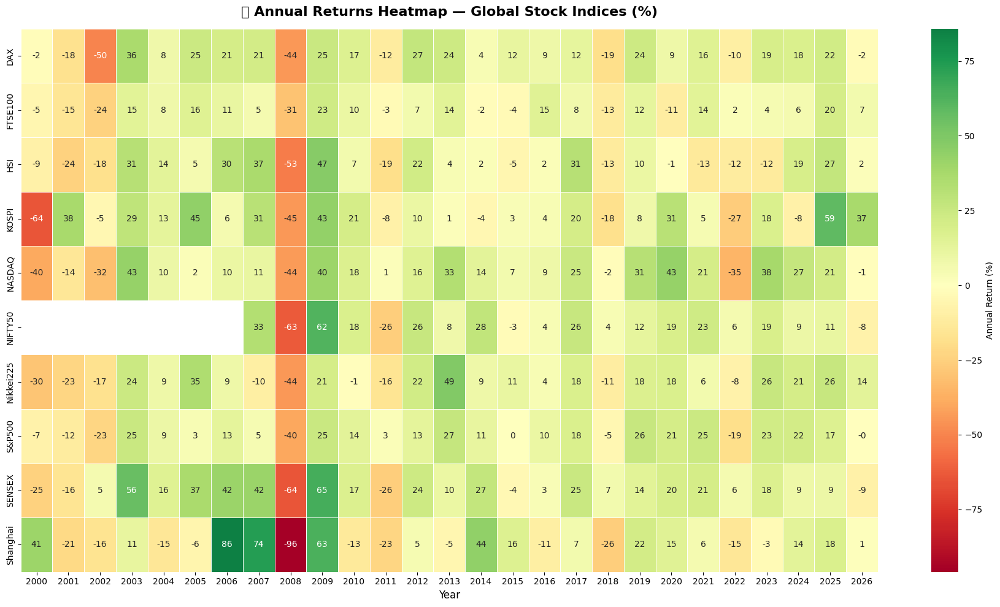

💾 Saved: annual_returns_heatmap.png


In [ ]:
# ─── 4.6  Annual Returns Heatmap — Stock Indices ─────────────────────────────
idx_annual = df[df['symbol'].isin(indices)].copy()
idx_annual['year'] = idx_annual['date'].dt.year
annual_ret = idx_annual.groupby(['year','asset_name'])['daily_return'].sum() * 100
annual_pivot = annual_ret.unstack(level='asset_name')

plt.figure(figsize=(18, 10))
sns.heatmap(annual_pivot.T, cmap='RdYlGn', center=0, annot=True, fmt='.0f',
            linewidths=0.5, linecolor='white', cbar_kws={'label':'Annual Return (%)'})
plt.title('📅 Annual Returns Heatmap — Global Stock Indices (%)', fontsize=16, fontweight='bold', pad=15)
plt.xlabel('Year', fontsize=12)
plt.ylabel('')
plt.tight_layout()
plt.savefig('annual_returns_heatmap.png', dpi=150, bbox_inches='tight')
plt.show()
print("💾 Saved: annual_returns_heatmap.png")

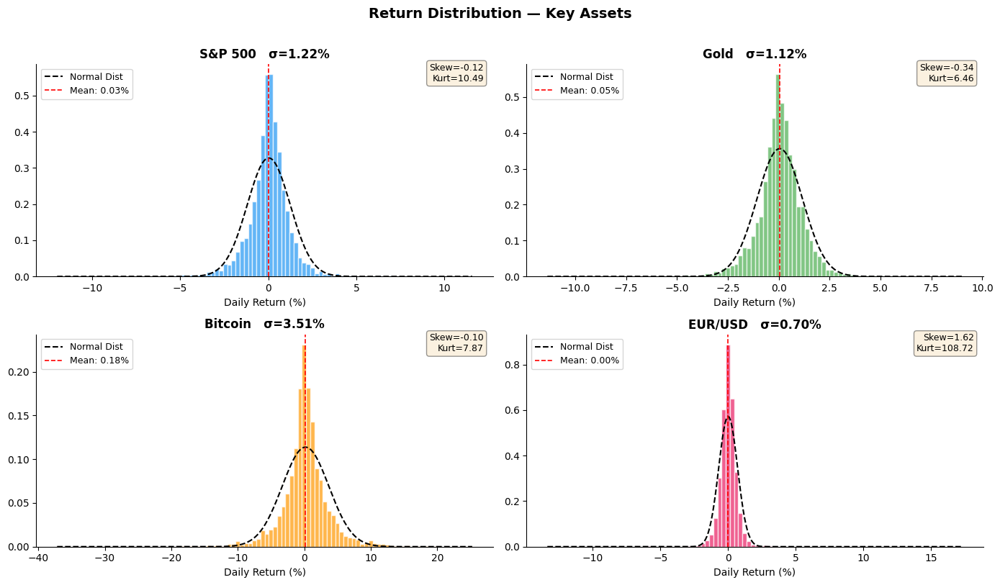

💾 Saved: return_distributions.png


In [ ]:
# ─── 4.7  Return Distribution — Histogram ────────────────────────────────────
key_assets = ['^GSPC','GC=F','BTC-USD','EURUSD=X']
key_names  = ['S&P 500','Gold','Bitcoin','EUR/USD']

fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()

for i, (sym, name) in enumerate(zip(key_assets, key_names)):
    r = df[df['symbol']==sym]['daily_return'].dropna() * 100
    axes[i].hist(r, bins=100, color=COLORS[i], alpha=0.7, edgecolor='white', density=True)
    mu, sigma = r.mean(), r.std()
    x = np.linspace(r.min(), r.max(), 300)
    axes[i].plot(x, norm.pdf(x, mu, sigma), 'k--', linewidth=1.5, label='Normal Dist')
    axes[i].axvline(mu, color='red', linewidth=1.2, linestyle='--', label=f'Mean: {mu:.2f}%')
    axes[i].set_title(f'{name}   σ={sigma:.2f}%', fontsize=12, fontweight='bold')
    axes[i].set_xlabel('Daily Return (%)')
    axes[i].legend(fontsize=9)
    skew = r.skew()
    kurt = r.kurtosis()
    axes[i].text(0.98, 0.92, f'Skew={skew:.2f}\nKurt={kurt:.2f}',
                 transform=axes[i].transAxes, ha='right', fontsize=9,
                 bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.4))

plt.suptitle('Return Distribution — Key Assets', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('return_distributions.png', dpi=150, bbox_inches='tight')
plt.show()
print("💾 Saved: return_distributions.png")

## 🚨 STEP 5 — Crisis Event Analysis <a id='crisis'></a>

In [ ]:
# ─── 5.1  S&P 500 with All Crisis Events Marked ──────────────────────────────
sp = df[df['symbol'] == '^GSPC'].copy()

crises = {
    'Dotcom Crash':    ('2000-03-10', '#E91E63'),
    '9/11 Attack':     ('2001-09-11', '#FF5722'),
    'GFC Peak':        ('2007-10-09', '#F44336'),
    'Lehman Brothers': ('2008-09-15', '#9C27B0'),
    'COVID Crash':     ('2020-03-16', '#2196F3'),
    'SVB Collapse':    ('2023-03-10', '#FF9800'),
}

fig = go.Figure()
fig.add_trace(go.Scatter(x=sp['date'], y=sp['close'], name='S&P 500',
                         line=dict(color='#2196F3', width=1.8), fill='tozeroy',
                         fillcolor='rgba(33,150,243,0.08)'))

# Adding lines and annotations manually to bypass the add_vline internal error
for event, (date_str, color) in crises.items():
    # Draw the line
    fig.add_shape(type='line', x0=date_str, x1=date_str, y0=0, y1=1,
                  xref='x', yref='paper', line=dict(color=color, width=1.5, dash='dash'))
    # Add the text label
    fig.add_annotation(x=date_str, y=1, yref='paper', text=event, showarrow=False,
                       font=dict(color=color, size=11), textangle=0, yanchor='bottom')

fig.update_layout(
    title='🚨 S&P 500 — With All Major Crisis Events (2000–2026)',
    xaxis_title='Date', yaxis_title='Index Value',
    template='plotly_white', height=500, hovermode='x unified'
)
fig.show()

In [ ]:
# ─── 5.2  Maximum Drawdown Calculation ───────────────────────────────────────
def max_drawdown(series):
    roll_max = series.cummax()
    drawdown = (series - roll_max) / roll_max
    return drawdown.min() * 100

mdd_data = []
for sym in df['symbol'].unique():
    s = df[df['symbol']==sym].set_index('date')['close'].dropna()
    if len(s) > 30:
        mdd_data.append({
            'Symbol': sym,
            'Asset Name': df[df['symbol']==sym]['asset_name'].iloc[0],
            'Asset Type': df[df['symbol']==sym]['asset_type'].iloc[0],
            'Max Drawdown %': round(max_drawdown(s), 2)
        })

mdd_df = pd.DataFrame(mdd_data).sort_values('Max Drawdown %')

fig = px.bar(mdd_df, x='Max Drawdown %', y='Asset Name', orientation='h',
             color='Asset Type',
             color_discrete_map={'Stock Index':'#2196F3','Commodity':'#FF9800',
                                  'Currency':'#4CAF50','Cryptocurrency':'#E91E63'},
             title='📉 Maximum Drawdown — All 34 Assets',
             template='plotly_white')
fig.update_layout(height=750)
fig.show()
print(mdd_df.to_string(index=False))

   Symbol      Asset Name     Asset Type  Max Drawdown %
     CL=F Crude Oil (WTI)      Commodity         -125.90
  ADA-USD         Cardano Cryptocurrency          -97.85
  SOL-USD          Solana Cryptocurrency          -96.27
  XRP-USD          Ripple Cryptocurrency          -95.87
  ETH-USD        Ethereum Cryptocurrency          -93.96
  LTC-USD        Litecoin Cryptocurrency          -93.45
 DOGE-USD        Dogecoin Cryptocurrency          -92.26
     NG=F     Natural Gas      Commodity          -90.36
     BZ=F     Brent Crude      Commodity          -86.77
  BTC-USD         Bitcoin Cryptocurrency          -83.40
  BNB-USD             BNB Cryptocurrency          -80.10
    ^IXIC          NASDAQ    Stock Index          -77.93
     SI=F          Silver      Commodity          -75.85
   ^GDAXI             DAX    Stock Index          -72.68
000001.SS        Shanghai    Stock Index          -71.98
     ZW=F           Wheat      Commodity          -71.80
     HG=F          Copper      

In [ ]:
# ─── 5.3  COVID Crash & Recovery — All Indices ───────────────
covid_start = '2020-01-01'
covid_end   = '2021-12-31'

covid_df = df[(df['symbol'].isin(indices)) &
              (df['date'] >= covid_start) & (df['date'] <= covid_end)].copy()

first_vals = covid_df.groupby('symbol')['close'].transform('first')
covid_df['normalized'] = (covid_df['close'] / first_vals) * 100

fig = px.line(covid_df, x='date', y='normalized', color='asset_name',
              title='တဠ COVID-19 Crash & Recovery — Stock Indices (Jan 2020 – Dec 2021)',
              labels={'normalized':'Index Value (Base=100 on Jan 1, 2020)'},
              template='plotly_white')

# Adding vline and annotation manually to avoid internal Plotly TypeError
bottom_date = '2020-03-16'
fig.add_shape(type='line', x0=bottom_date, x1=bottom_date, y0=0, y1=1,
              xref='x', yref='paper', line=dict(color='red', width=1.5, dash='dash'))

fig.add_annotation(x=bottom_date, y=1, yref='paper',
                   text='Market Bottom<br>(Mar 16, 2020)', showarrow=False,
                   font=dict(color='red', size=11), xanchor='left', yanchor='top')

fig.update_layout(hovermode='x unified')
fig.show()

## 🔗 STEP 6 — Cross-Asset Correlation Analysis <a id='correlation'></a>

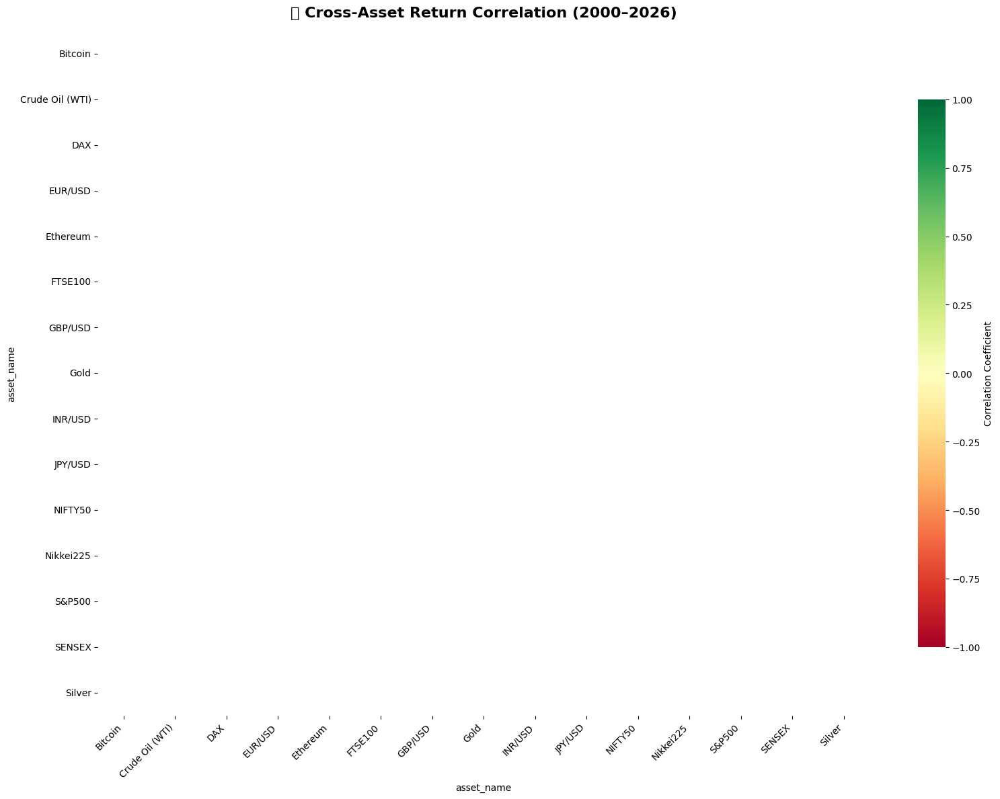

💾 Saved: correlation_heatmap.png


In [ ]:
# ─── 6.1  Correlation Heatmap — All Asset Types ──────────────────────────────
corr_symbols = ['^GSPC','^GDAXI','^BSESN','^NSEI','^FTSE','^N225',
                'GC=F','CL=F','SI=F','BTC-USD','ETH-USD',
                'EURUSD=X','GBPUSD=X','JPYUSD=X','INRUSD=X']

pivot_ret = df[df['symbol'].isin(corr_symbols)].pivot_table(
    index='date', columns='asset_name', values='daily_return')
pivot_ret = pivot_ret.dropna(thresh=int(len(pivot_ret)*0.5))
corr_matrix = pivot_ret.corr()

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
plt.figure(figsize=(16, 12))
sns.heatmap(corr_matrix, mask=mask, cmap='RdYlGn', center=0, vmin=-1, vmax=1,
            annot=True, fmt='.2f', linewidths=0.5, linecolor='white',
            cbar_kws={'shrink': 0.8, 'label': 'Correlation Coefficient'})
plt.title('🔗 Cross-Asset Return Correlation (2000–2026)', fontsize=16, fontweight='bold', pad=15)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig('correlation_heatmap.png', dpi=150, bbox_inches='tight')
plt.show()
print("💾 Saved: correlation_heatmap.png")

In [ ]:
# ─── 6.2  Rolling Correlation — S&P 500 vs Gold (Safe Haven Analysis) ────────
sp_ret   = df[df['symbol']=='^GSPC'].set_index('date')['daily_return']
gold_ret = df[df['symbol']=='GC=F'].set_index('date')['daily_return']
btc_ret  = df[df['symbol']=='BTC-USD'].set_index('date')['daily_return']

combined = pd.DataFrame({'SP500': sp_ret, 'Gold': gold_ret, 'Bitcoin': btc_ret}).dropna()

combined['roll_corr_gold'] = combined['SP500'].rolling(252).corr(combined['Gold'])
combined['roll_corr_btc']  = combined['SP500'].rolling(252).corr(combined['Bitcoin'])

fig = go.Figure()
fig.add_trace(go.Scatter(x=combined.index, y=combined['roll_corr_gold'],
                         name='S&P 500 vs Gold', line=dict(color='#FF9800', width=2)))
fig.add_trace(go.Scatter(x=combined.index, y=combined['roll_corr_btc'],
                         name='S&P 500 vs Bitcoin', line=dict(color='#9C27B0', width=2)))
fig.add_hline(y=0, line_dash='dash', line_color='gray', line_width=1)
fig.update_layout(
    title='📊 1-Year Rolling Correlation — S&P 500 vs Gold & Bitcoin',
    yaxis_title='Rolling Correlation', template='plotly_white', hovermode='x unified')
fig.show()

## 🌊 STEP 7 — Volatility Analysis <a id='volatility'></a>

In [ ]:
# ─── 7.1  Volatility Comparison — Bar Chart ───────────────────────────────────
vol_data = []
for sym in df['symbol'].unique():
    sub = df[df['symbol']==sym]['daily_return'].dropna()
    if len(sub) > 30:
        vol_data.append({
            'Asset Name': df[df['symbol']==sym]['asset_name'].iloc[0],
            'Asset Type': df[df['symbol']==sym]['asset_type'].iloc[0],
            'Annualized Volatility (%)': round(sub.std() * np.sqrt(252) * 100, 2)
        })

vol_df = pd.DataFrame(vol_data).sort_values('Annualized Volatility (%)', ascending=False)

fig = px.bar(vol_df, x='Asset Name', y='Annualized Volatility (%)', color='Asset Type',
             color_discrete_map={'Stock Index':'#2196F3','Commodity':'#FF9800',
                                  'Currency':'#4CAF50','Cryptocurrency':'#E91E63'},
             title='📊 Annualized Volatility — All 34 Assets (Full History)',
             template='plotly_white')
fig.update_layout(xaxis_tickangle=-45, height=500)
fig.show()
print(vol_df.to_string(index=False))

     Asset Name     Asset Type  Annualized Volatility (%)
       Dogecoin Cryptocurrency                     145.92
        Cardano Cryptocurrency                     103.40
         Solana Cryptocurrency                     100.70
         Ripple Cryptocurrency                      94.22
       Litecoin Cryptocurrency                      82.72
            BNB Cryptocurrency                      79.89
Crude Oil (WTI)      Commodity                      77.60
       Ethereum Cryptocurrency                      71.16
    Natural Gas      Commodity                      61.49
        Bitcoin Cryptocurrency                      55.66
    Brent Crude      Commodity                      37.87
         Silver      Commodity                      32.87
          Wheat      Commodity                      32.31
           Corn      Commodity                      28.20
         Copper      Commodity                      27.25
         NASDAQ    Stock Index                      24.86
            HS

In [ ]:
# ─── 7.2  Rolling Volatility — S&P 500 Through Time ─────────────────────────
sp = df[df['symbol']=='^GSPC'].copy()

fig = make_subplots(rows=2, cols=1, shared_xaxes=True, row_heights=[0.6, 0.4],
                    subplot_titles=['S&P 500 Close Price', '30-Day Rolling Volatility (Annualized %)'])
fig.add_trace(go.Scatter(x=sp['date'], y=sp['close'], name='Close Price',
                         line=dict(color='#2196F3')), row=1, col=1)
fig.add_trace(go.Scatter(x=sp['date'], y=sp['volatility_30d'], name='Volatility',
                         line=dict(color='#E91E63'), fill='tozeroy',
                         fillcolor='rgba(233,30,99,0.1)'), row=2, col=1)

for event, (date, color) in crises.items():
    fig.add_vline(x=date, line_dash='dot', line_color=color, line_width=1, row='all', col=1)

fig.update_layout(height=600, template='plotly_white',
                  title='S&P 500 — Price & Rolling Volatility with Crisis Events',
                  hovermode='x unified')
fig.show()

## 📐 STEP 8 — Statistical Analysis (Sharpe, VaR, Beta) <a id='stats'></a>

In [ ]:
# ─── 8.1  Comprehensive Performance Metrics — All Assets ─────────────────────
RISK_FREE_RATE = 0.02  # 2% annual risk-free rate

results = []
for sym in df['symbol'].unique():
    sub = df[df['symbol']==sym].copy()
    r = sub['daily_return'].dropna()
    if len(r) < 100:
        continue

    total_return = ((1 + r).prod() - 1) * 100
    ann_return   = (r.mean() * 252) * 100
    ann_vol      = r.std() * np.sqrt(252) * 100
    sharpe       = (ann_return/100 - RISK_FREE_RATE) / (ann_vol/100) if ann_vol != 0 else 0
    var_95       = np.percentile(r, 5) * 100
    var_99       = np.percentile(r, 1) * 100
    cvar_95      = r[r <= np.percentile(r, 5)].mean() * 100
    skewness     = r.skew()
    kurtosis     = r.kurtosis()
    best_day     = r.max() * 100
    worst_day    = r.min() * 100

    results.append({
        'Asset':         sub['asset_name'].iloc[0],
        'Type':          sub['asset_type'].iloc[0],
        'Total Return %':round(total_return, 1),
        'Ann. Return %': round(ann_return, 2),
        'Ann. Vol %':    round(ann_vol, 2),
        'Sharpe Ratio':  round(sharpe, 3),
        'VaR 95% (Day)': round(var_95, 2),
        'VaR 99% (Day)': round(var_99, 2),
        'CVaR 95%':      round(cvar_95, 2),
        'Skewness':      round(skewness, 3),
        'Kurtosis':      round(kurtosis, 3),
        'Best Day %':    round(best_day, 2),
        'Worst Day %':   round(worst_day, 2),
    })

stats_df = pd.DataFrame(results).sort_values('Sharpe Ratio', ascending=False)
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', '{:.2f}'.format)
print("📊 Complete Performance Metrics — All Assets:")
stats_df

📊 Complete Performance Metrics — All Assets:


,Asset,Type,Total Return %,Ann. Return %,Ann. Vol %,Sharpe Ratio,VaR 95% (Day),VaR 99% (Day),CVaR 95%,Skewness,Kurtosis,Best Day %,Worst Day %
21,Solana,Cryptocurrency,8831.60,101.84,100.70,0.99,-8.46,-14.91,-12.71,0.56,6.00,47.28,-42.28
3,BNB,Cryptocurrency,30409.90,77.48,79.89,0.94,-6.43,-12.42,-10.20,2.11,29.55,69.76,-41.90
4,Bitcoin,Cryptocurrency,15873.90,45.89,55.66,0.79,-5.29,-10.05,-8.19,-0.10,7.87,25.25,-37.17
10,Dogecoin,Cryptocurrency,6550.00,101.54,145.92,0.68,-7.71,-14.94,-12.26,19.75,726.44,354.67,-40.25
14,Gold,Commodity,1638.60,12.79,17.78,0.61,-1.75,-3.11,-2.63,-0.34,6.46,9.03,-11.37
1,Cardano,Cryptocurrency,677.90,63.53,103.40,0.59,-7.97,-13.23,-11.46,5.22,87.31,136.56,-39.39
22,Ripple,Cryptocurrency,523.20,56.04,94.22,0.57,-6.99,-12.91,-11.30,3.03,34.45,83.46,-42.33
11,Ethereum,Cryptocurrency,612.20,41.69,71.16,0.56,-6.74,-12.68,-10.27,-0.10,6.13,26.46,-42.35
18,Litecoin,Cryptocurrency,988.70,47.65,82.72,0.55,-7.30,-13.19,-11.10,1.26,16.63,66.76,-40.22
25,SENSEX,Stock Index,1342.80,12.78,21.84,0.49,-2.06,-3.98,-3.30,-0.14,10.32,17.34,-13.15


In [ ]:
# ─── 8.2  Sharpe Ratio Comparison Chart ──────────────────────────────────────
sharpe_df = stats_df[['Asset','Type','Sharpe Ratio']].sort_values('Sharpe Ratio', ascending=True)

fig = px.bar(sharpe_df, x='Sharpe Ratio', y='Asset', orientation='h', color='Type',
             color_discrete_map={'Stock Index':'#2196F3','Commodity':'#FF9800',
                                  'Currency':'#4CAF50','Cryptocurrency':'#E91E63'},
             title='⚖️ Sharpe Ratio — Risk-Adjusted Returns (All Assets)',
             template='plotly_white')
fig.add_vline(x=1.0, line_dash='dash', line_color='green',
              annotation_text='Good (>1.0)', annotation_position='top right')
fig.add_vline(x=0.0, line_dash='dash', line_color='red',
              annotation_text='Break-even', annotation_position='bottom right')
fig.update_layout(height=700)
fig.show()

In [ ]:
# ─── 8.3  Risk vs Return Scatter Plot ────────────────────────────────────────
fig = px.scatter(stats_df, x='Ann. Vol %', y='Ann. Return %',
                 color='Type', text='Asset', size_max=15,
                 color_discrete_map={'Stock Index':'#2196F3','Commodity':'#FF9800',
                                      'Currency':'#4CAF50','Cryptocurrency':'#E91E63'},
                 title='🎯 Risk vs Return — All Assets (Efficient Frontier View)',
                 template='plotly_white',
                 labels={'Ann. Vol %':'Annualized Volatility (Risk) %',
                         'Ann. Return %':'Annualized Return %'})
fig.update_traces(textposition='top center', marker=dict(size=10, opacity=0.8))
fig.add_hline(y=0, line_dash='dash', line_color='gray', opacity=0.5)
fig.show()

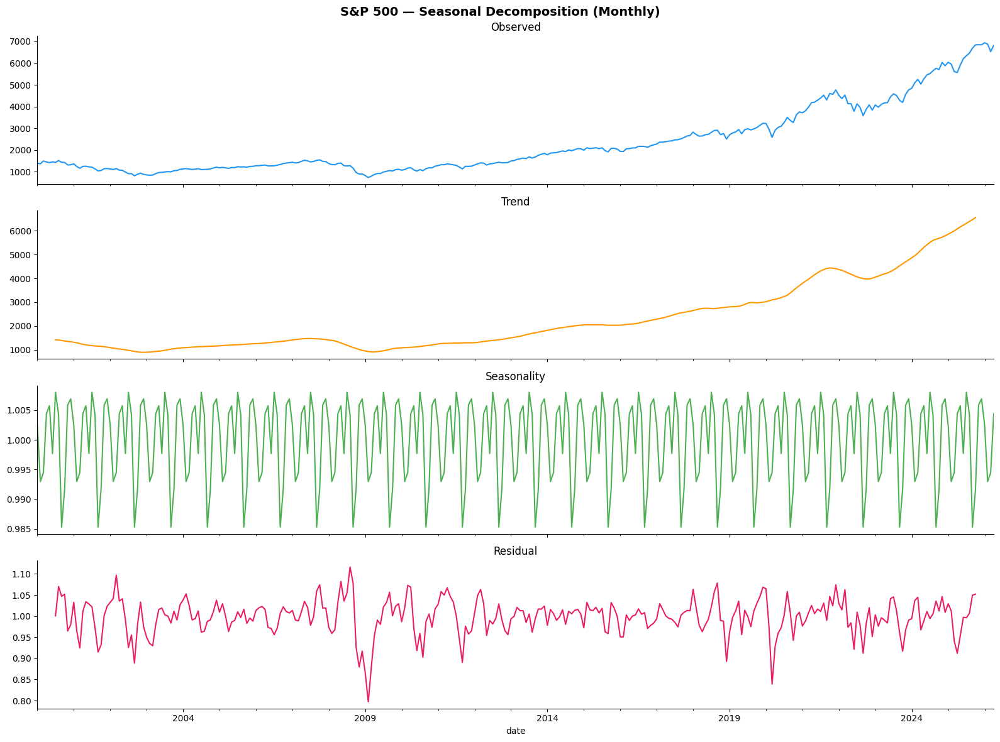

💾 Saved: seasonal_decomposition.png


In [ ]:
# ─── 8.4  Seasonal Decomposition — S&P 500 Monthly ───────────────────────────
sp_monthly = df[df['symbol']=='^GSPC'].set_index('date')['close']
sp_monthly = sp_monthly.resample('ME').last().dropna()

decomp = seasonal_decompose(sp_monthly, model='multiplicative', period=12)

fig, axes = plt.subplots(4, 1, figsize=(16, 12), sharex=True)
decomp.observed.plot(ax=axes[0], color='#2196F3', title='Observed')
decomp.trend.plot(ax=axes[1], color='#FF9800', title='Trend')
decomp.seasonal.plot(ax=axes[2], color='#4CAF50', title='Seasonality')
decomp.resid.plot(ax=axes[3], color='#E91E63', title='Residual')
for ax in axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
plt.suptitle('S&P 500 — Seasonal Decomposition (Monthly)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('seasonal_decomposition.png', dpi=150, bbox_inches='tight')
plt.show()
print("💾 Saved: seasonal_decomposition.png")

In [ ]:
# ─── 8.5  ADF Stationarity Test ───────────────────────────────────────────────
print("📊 Augmented Dickey-Fuller Test (Stationarity Check)")
print("  H0: Series has unit root (non-stationary)")
print("  p < 0.05 → Reject H0 → Series is STATIONARY\n")

for sym, name in [('^GSPC','S&P 500'),('GC=F','Gold'),('BTC-USD','Bitcoin'),('EURUSD=X','EUR/USD')]:
    series = df[df['symbol']==sym].set_index('date')['close'].dropna()
    adf_result = adfuller(series)
    status = '✅ Stationary' if adf_result[1] < 0.05 else '❌ Non-Stationary'
    print(f"  {name:<12}: ADF={adf_result[0]:.4f}  p={adf_result[1]:.4f}  → {status}")

print("\n  (Note: Returns are usually stationary, prices are not)")

📊 Augmented Dickey-Fuller Test (Stationarity Check)
  H0: Series has unit root (non-stationary)
  p < 0.05 → Reject H0 → Series is STATIONARY

  S&P 500     : ADF=2.6474  p=0.9991  → ❌ Non-Stationary
  Gold        : ADF=3.3193  p=1.0000  → ❌ Non-Stationary
  Bitcoin     : ADF=-1.1210  p=0.7066  → ❌ Non-Stationary
  EUR/USD     : ADF=-2.0883  p=0.2492  → ❌ Non-Stationary

  (Note: Returns are usually stationary, prices are not)


## 🤖 STEP 9 — Machine Learning: Price Prediction <a id='ml'></a>

In [ ]:
# ─── 9.1  Feature Engineering for ML ─────────────────────────────────────────
sp_ml = df[df['symbol']=='^GSPC'].copy().sort_values('date').reset_index(drop=True)

# Additional ML features
sp_ml['ma7']   = sp_ml['close'].rolling(7).mean()
sp_ml['ma30']  = sp_ml['close'].rolling(30).mean()
sp_ml['ma200'] = sp_ml['close'].rolling(200).mean()
sp_ml['ema12'] = sp_ml['close'].ewm(span=12).mean()
sp_ml['ema26'] = sp_ml['close'].ewm(span=26).mean()
sp_ml['macd']  = sp_ml['ema12'] - sp_ml['ema26']
sp_ml['vol_20']= sp_ml['daily_return'].rolling(20).std()
sp_ml['rsi14'] = compute_rsi(sp_ml['close'])
sp_ml['lag1']  = sp_ml['close'].shift(1)
sp_ml['lag5']  = sp_ml['close'].shift(5)
sp_ml['lag10'] = sp_ml['close'].shift(10)
sp_ml['lag21'] = sp_ml['close'].shift(21)
sp_ml['return_lag1'] = sp_ml['daily_return'].shift(1)
sp_ml['return_lag5'] = sp_ml['daily_return'].shift(5)

sp_ml = sp_ml.dropna()

FEATURES = ['open','high','low','volume','ma7','ma30','ma200',
            'ema12','ema26','macd','vol_20','rsi14',
            'lag1','lag5','lag10','lag21','return_lag1','return_lag5']
TARGET = 'close'

X = sp_ml[FEATURES]
y = sp_ml[TARGET]

# Time-series split (NO shuffle — preserve temporal order)
split = int(len(X) * 0.80)
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]
dates_test = sp_ml['date'].iloc[split:]

print(f"✅ ML Features: {FEATURES}")
print(f"   Training samples : {len(X_train):,}")
print(f"   Test samples     : {len(X_test):,}")

✅ ML Features: ['open', 'high', 'low', 'volume', 'ma7', 'ma30', 'ma200', 'ema12', 'ema26', 'macd', 'vol_20', 'rsi14', 'lag1', 'lag5', 'lag10', 'lag21', 'return_lag1', 'return_lag5']
   Training samples : 5,126
   Test samples     : 1,282


In [ ]:
# ─── 9.2  Train Multiple Models & Compare ────────────────────────────────────
models = {
    'Linear Regression':    LinearRegression(),
    'Random Forest':        RandomForestRegressor(n_estimators=200, max_depth=10,
                                                   random_state=42, n_jobs=-1),
    'Gradient Boosting':    GradientBoostingRegressor(n_estimators=200, max_depth=5,
                                                       learning_rate=0.05, random_state=42)
}

predictions = {}
model_results = []

for name, model in models.items():
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    predictions[name] = preds
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    mae  = mean_absolute_error(y_test, preds)
    r2   = r2_score(y_test, preds)
    mape = np.mean(np.abs((y_test.values - preds) / y_test.values)) * 100
    model_results.append({'Model': name, 'RMSE': round(rmse,2), 'MAE': round(mae,2),
                          'R² Score': round(r2,4), 'MAPE %': round(mape,2)})
    print(f"  {name:<25} | RMSE={rmse:.1f}  MAE={mae:.1f}  R²={r2:.4f}  MAPE={mape:.2f}%")

results_df = pd.DataFrame(model_results)
print()
print("🏆 Best Model:", results_df.loc[results_df['R² Score'].idxmax(), 'Model'])
results_df

  Linear Regression         | RMSE=17.6  MAE=12.7  R²=0.9997  MAPE=0.26%
  Random Forest             | RMSE=1446.1  MAE=1089.1  R²=-1.2486  MAPE=19.10%
  Gradient Boosting         | RMSE=1447.7  MAE=1090.3  R²=-1.2537  MAPE=19.12%

🏆 Best Model: Linear Regression


,Model,RMSE,MAE,R² Score,MAPE %
0,Linear Regression,17.61,12.75,1.00,0.26
1,Random Forest,1446.09,1089.14,-1.25,19.10
2,Gradient Boosting,1447.71,1090.32,-1.25,19.12


In [ ]:
# ─── 9.3  Best Model Predictions vs Actual ───────────────────────────────────
best_model_name = results_df.loc[results_df['R² Score'].idxmax(), 'Model']
best_preds = predictions[best_model_name]

fig = go.Figure()
fig.add_trace(go.Scatter(x=dates_test, y=y_test.values,
                         name='Actual Price', line=dict(color='#2196F3', width=2)))
fig.add_trace(go.Scatter(x=dates_test, y=best_preds,
                         name=f'Predicted ({best_model_name})',
                         line=dict(color='#FF9800', width=2, dash='dot')))
fig.update_layout(
    title=f'📈 S&P 500 — Actual vs Predicted ({best_model_name})',
    xaxis_title='Date', yaxis_title='Price (USD)',
    template='plotly_white', hovermode='x unified'
)
fig.show()

In [ ]:
# ─── 9.4  Feature Importance ─────────────────────────────────────────────────
rf_model = models['Random Forest']
feat_imp = pd.DataFrame({
    'Feature':   FEATURES,
    'Importance': rf_model.feature_importances_
}).sort_values('Importance', ascending=False)

fig = px.bar(feat_imp, x='Importance', y='Feature', orientation='h',
             color='Importance', color_continuous_scale='Blues',
             title='🌳 Random Forest — Feature Importance for S&P 500 Prediction',
             template='plotly_white')
fig.update_layout(yaxis={'categoryorder':'total ascending'}, height=550)
fig.show()
print(feat_imp.to_string(index=False))

    Feature  Importance
        low        0.65
       high        0.34
       open        0.01
      ema12        0.00
      ma200        0.00
      ema26        0.00
       lag1        0.00
       ma30        0.00
        ma7        0.00
      lag10        0.00
       lag5        0.00
      rsi14        0.00
return_lag1        0.00
return_lag5        0.00
     volume        0.00
      lag21        0.00
     vol_20        0.00
       macd        0.00


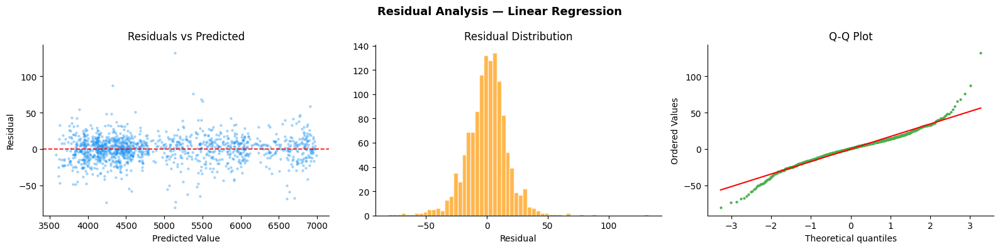

💾 Saved: residual_analysis.png


In [ ]:
# ─── 9.5  Residual Analysis ───────────────────────────────────────────────────
residuals = y_test.values - best_preds

fig, axes = plt.subplots(1, 3, figsize=(16, 4))

# Scatter plot
axes[0].scatter(best_preds, residuals, alpha=0.3, color='#2196F3', s=5)
axes[0].axhline(0, color='red', linestyle='--', linewidth=1.2)
axes[0].set_xlabel('Predicted Value')
axes[0].set_ylabel('Residual')
axes[0].set_title('Residuals vs Predicted')

# Histogram
axes[1].hist(residuals, bins=60, color='#FF9800', alpha=0.7, edgecolor='white')
axes[1].set_xlabel('Residual')
axes[1].set_title('Residual Distribution')

# Q-Q Plot
stats.probplot(residuals, dist='norm', plot=axes[2])
axes[2].set_title('Q-Q Plot')
axes[2].get_lines()[0].set(color='#4CAF50', markersize=2)

plt.suptitle(f'Residual Analysis — {best_model_name}', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('residual_analysis.png', dpi=150, bbox_inches='tight')
plt.show()
print("💾 Saved: residual_analysis.png")

## 💾 STEP 10 — Export Files for Power BI & PPT <a id='export'></a>

In [ ]:
# ─── 10.1  Export Cleaned Master Dataset for Power BI ─────────────────────────
export_cols = ['date','symbol','asset_name','asset_type','region',
               'open','high','low','close','volume',
               'year','month','quarter','daily_return','return_pct',
               'log_return','price_range','ma7','ma30','volatility_30d','rsi14']

df_export = df[export_cols].copy()
df_export.to_csv('powerbi_master.csv', index=False)
print(f"✅ Master file saved: powerbi_master.csv  ({len(df_export):,} rows)")

# ─── 10.2  Yearly Returns Table ───────────────────────────────────────────────
yearly_ret = df.groupby(['year','symbol','asset_name','asset_type'])['daily_return'].agg(
    ['sum','std','count']).reset_index()
yearly_ret.columns = ['Year','Symbol','Asset Name','Asset Type','Annual Return','Volatility','Trading Days']
yearly_ret['Annual Return %'] = (yearly_ret['Annual Return'] * 100).round(2)
yearly_ret['Volatility %']    = (yearly_ret['Volatility'] * np.sqrt(252) * 100).round(2)
yearly_ret.to_csv('yearly_returns.csv', index=False)
print(f"✅ Yearly returns: yearly_returns.csv")

# ─── 10.3  Performance Stats Table ────────────────────────────────────────────
stats_df.to_csv('performance_stats.csv', index=False)
print(f"✅ Performance metrics: performance_stats.csv")

# ─── 10.4  ML Results ─────────────────────────────────────────────────────────
ml_out = pd.DataFrame({
    'date':      dates_test.values,
    'actual':    y_test.values,
    'predicted': best_preds,
    'error':     y_test.values - best_preds
})
ml_out.to_csv('ml_predictions.csv', index=False)
print(f"✅ ML predictions: ml_predictions.csv")

results_df.to_csv('model_comparison.csv', index=False)
print(f"✅ Model comparison: model_comparison.csv")
print()
print("═" * 50)
print("  📁 FILES READY FOR POWER BI & PPT:")
print("  1. powerbi_master.csv        ← Main dataset")
print("  2. yearly_returns.csv        ← Annual analysis")
print("  3. performance_stats.csv     ← Sharpe, VaR etc")
print("  4. ml_predictions.csv        ← Model output")
print("  5. model_comparison.csv      ← RMSE, R² table")
print("  6. annual_returns_heatmap.png")
print("  7. correlation_heatmap.png")
print("  8. return_distributions.png")
print("  9. seasonal_decomposition.png")
print(" 10. residual_analysis.png")
print("═" * 50)

✅ Master file saved: powerbi_master.csv  (186,348 rows)
✅ Yearly returns: yearly_returns.csv
✅ Performance metrics: performance_stats.csv
✅ ML predictions: ml_predictions.csv
✅ Model comparison: model_comparison.csv

══════════════════════════════════════════════════
  📁 FILES READY FOR POWER BI & PPT:
  1. powerbi_master.csv        ← Main dataset
  2. yearly_returns.csv        ← Annual analysis
  3. performance_stats.csv     ← Sharpe, VaR etc
  4. ml_predictions.csv        ← Model output
  5. model_comparison.csv      ← RMSE, R² table
  6. annual_returns_heatmap.png
  7. correlation_heatmap.png
  8. return_distributions.png
  9. seasonal_decomposition.png
 10. residual_analysis.png
══════════════════════════════════════════════════


In [ ]:
# ─── 10.5  Download all files (Google Colab) ─────────────────────────────────
from google.colab import files
import glob

for f_path in glob.glob('*.csv') + glob.glob('*.png'):
    files.download(f_path)
    print(f"⬇️  Downloading: {f_path}")

print("\n✅ All files downloaded!")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

⬇️  Downloading: global_financial_markets_2000_Now.csv


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

⬇️  Downloading: powerbi_master.csv


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

⬇️  Downloading: ml_predictions.csv


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

⬇️  Downloading: performance_stats.csv


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

⬇️  Downloading: yearly_returns.csv


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

⬇️  Downloading: model_comparison.csv


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

⬇️  Downloading: correlation_heatmap.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

⬇️  Downloading: annual_returns_heatmap.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

⬇️  Downloading: seasonal_decomposition.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

⬇️  Downloading: residual_analysis.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

⬇️  Downloading: return_distributions.png

✅ All files downloaded!


---
## ✅ Project Summary

| Section | What We Did |
|---------|-------------|
| Data Loading | Loaded 186K rows, 34 assets, 2000–2026 |
| Cleaning | Null check, feature engineering, RSI, MA, Bollinger Bands |
| EDA | Normalized charts, distribution, heatmap, annual returns |
| Crisis Analysis | Dotcom, GFC, COVID, SVB marked on charts |
| Correlation | Cross-asset heatmap + rolling correlation |
| Volatility | Annualized vol, rolling vol, comparison |
| Statistics | Sharpe, VaR, CVaR, ADF test, Seasonal decomposition |
| ML Model | Linear Reg, Random Forest, Gradient Boosting — compared |
| Export | 5 CSVs + 5 PNGs ready for Power BI and PPT |

**Next Steps:**
1. Import `powerbi_master.csv` into Power BI
2. Copy PNG charts into your PPT slides
3. Use `performance_stats.csv` table in your MDD report

---
*Analysis by [Your Team Name] | Dataset: Global Financial Markets 2000–2026*